$$\text{Dog Breed Classification}$$

In [2]:
import pandas as pd 

data = pd.read_csv("dogs.csv")

train_data = data[data['data set'] == 'train']
valid_data = data[data['data set'] == 'valid']
test_data = data[data['data set'] == 'test']

train_data

,filepaths,labels,data set
0,train/Afghan/001.jpg,Afghan,train
1,train/Afghan/002.jpg,Afghan,train
2,train/Afghan/003.jpg,Afghan,train
3,train/Afghan/004.jpg,Afghan,train
4,train/Afghan/005.jpg,Afghan,train
...,...,...,...
7941,train/Yorkie/74.jpg,Yorkie,train
7942,train/Yorkie/75.jpg,Yorkie,train
7943,train/Yorkie/76.jpg,Yorkie,train
7944,train/Yorkie/77.jpg,Yorkie,train


In [3]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=32,
    class_mode='categorical')

validation_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=32,
    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

batch = train_generator.next()

Found 7946 validated image filenames belonging to 70 classes.
Found 700 validated image filenames belonging to 70 classes.
Found 700 validated image filenames belonging to 70 classes.


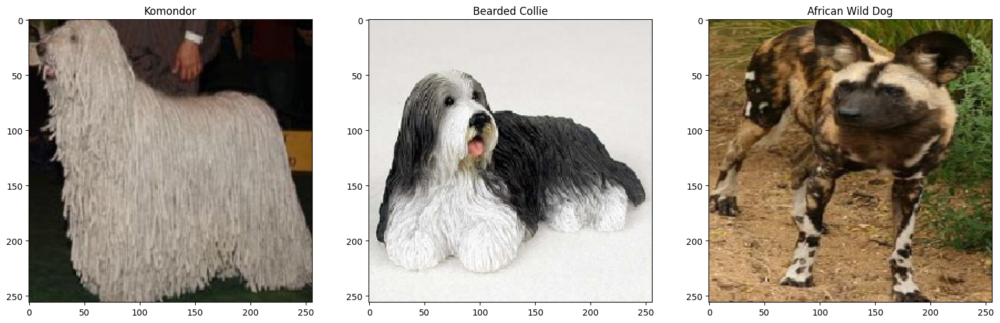

In [46]:
import matplotlib.pyplot as plt

def breed(arr):
    breed_names = {index: breed for breed, index in train_generator.class_indices.items()}
    for i in range(70):
        if arr[i] == 1:
            return breed_names[i]

figure, dim = plt.subplots(ncols=3, figsize=(20,20))
for i, img in enumerate(batch[0][0:3]):
    dim[i].imshow(img)
    dim[i].title.set_text(breed(batch[1][i]))

In [15]:
import tensorflow as tf 
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

number_of_breeds = 70
my_model = Sequential()

ResNet50_model = tf.keras.applications.ResNet50V2(
    include_top=False,
    input_shape=(256,256,3),
    pooling='avg',
    classes=number_of_breeds,
    weights='imagenet'
)
for layer in ResNet50_model.layers:
    layer.trainable = False

my_model.add(ResNet50_model)
my_model.add(Flatten())
my_model.add(Dense(512, activation='relu'))
my_model.add(Dense(number_of_breeds, activation='softmax'))

In [16]:
my_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [17]:
my_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dense_3 (Dense)             (None, 70)                35910     
                                                                 
Total params: 24649798 (94.03 MB)
Trainable params: 1084998 (4.14 MB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


In [18]:
import tensorflow as tf 

history = my_model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
)

Epoch 1/10
249/249 [==============================] - 170s 678ms/step - loss: 0.6628 - accuracy: 0.8232 - val_loss: 0.5420 - val_accuracy: 0.9200
Epoch 2/10
249/249 [==============================] - 174s 697ms/step - loss: 0.2264 - accuracy: 0.9257 - val_loss: 0.5679 - val_accuracy: 0.8943
Epoch 3/10
249/249 [==============================] - 174s 701ms/step - loss: 0.1371 - accuracy: 0.9533 - val_loss: 0.5643 - val_accuracy: 0.9114
Epoch 4/10
249/249 [==============================] - 175s 703ms/step - loss: 0.0997 - accuracy: 0.9656 - val_loss: 0.5620 - val_accuracy: 0.9271
Epoch 5/10
249/249 [==============================] - 173s 696ms/step - loss: 0.0681 - accuracy: 0.9787 - val_loss: 0.5786 - val_accuracy: 0.9286
Epoch 6/10
249/249 [==============================] - 174s 699ms/step - loss: 0.0499 - accuracy: 0.9829 - val_loss: 0.5883 - val_accuracy: 0.9214
Epoch 7/10
249/249 [==============================] - 175s 704ms/step - loss: 0.0522 - accuracy: 0.9833 - val_loss: 0.6461 -

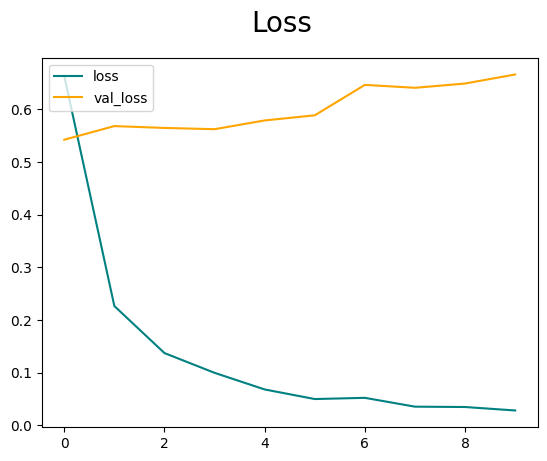

In [19]:
fig = plt.figure()
plt.plot(history.history['loss'], color='teal', label='loss')
plt.plot(history.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

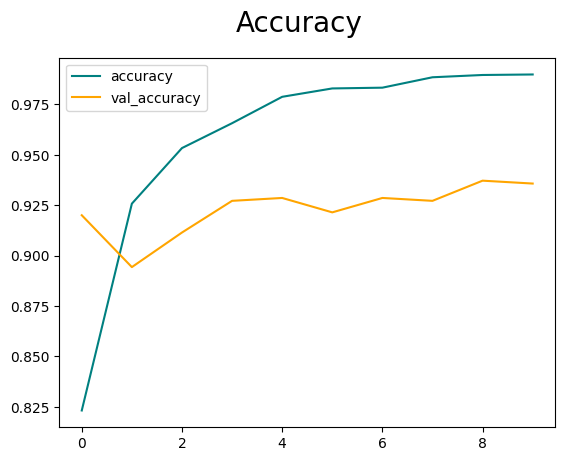

In [20]:
fig = plt.figure()
plt.plot(history.history['accuracy'], color='teal', label='accuracy')
plt.plot(history.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

In [21]:
my_model.evaluate(test_generator)

22/22 [==============================] - 14s 623ms/step - loss: 0.1614 - accuracy: 0.9486


[0.16144055128097534, 0.9485714435577393]

In [22]:
my_model.save('all_dog_breed_classifier.h5')

c:\Users\golde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [9]:
from keras.preprocessing.image import img_to_array, load_img
import numpy as np

def process_image(image_path):
    with Image.open(image_path) as img:
        # Rotate if width is greater than height
        if img.width > img.height:
            img = img.rotate(-90, expand=True)

        # Center crop to 1:1 ratio
        short_side = min(img.width, img.height)
        left = (img.width - short_side) / 2
        top = (img.height - short_side) / 2
        right = (img.width + short_side) / 2
        bottom = (img.height + short_side) / 2
        img = img.crop((left, top, right, bottom))

        return load_img(img, target_size=(256,256))

SyntaxError: invalid syntax (1425112491.py, line 21)

1/1 [==============================] - 1s 566ms/step
The predicted breed is: German Sheperd


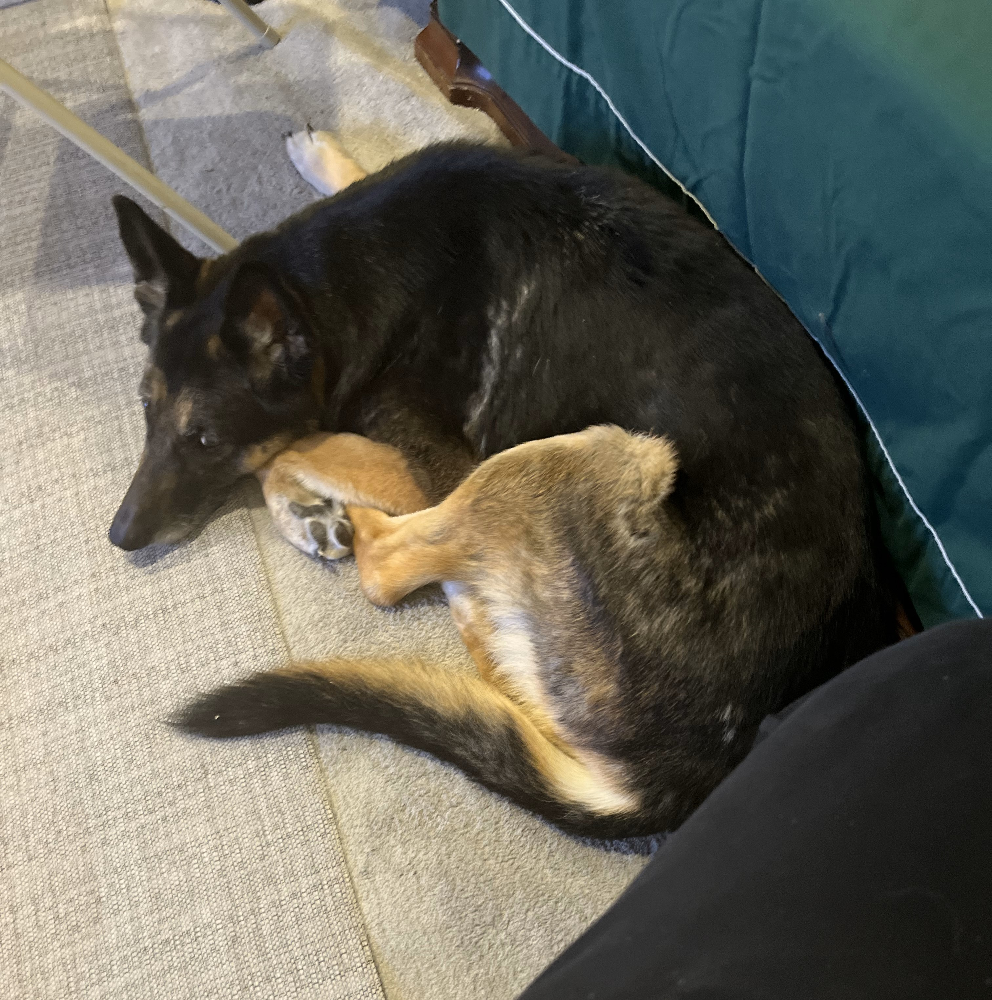

In [15]:
from keras.preprocessing.image import img_to_array, load_img
from keras.models import load_model
import numpy as np
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

my_model = load_model('all_dog_breed_classifier.h5')

# Load the image
image = load_img('Duke/yash.jpg', target_size=(256, 256))
image = img_to_array(image)
image = image / 255.0
image = np.expand_dims(image, axis=0)

# Make a prediction
prediction = my_model.predict(image)

predicted_class_index = np.argmax(prediction, axis=1)

breed_names = {index: breed for breed, index in train_generator.class_indices.items()}
predicted_breed = breed_names[predicted_class_index[0]]

print(f"The predicted breed is: {predicted_breed}")

display_img = Image.open('Duke/yash.jpg')
display(display_img)
